In [1]:
# In this notebook I will be making an instance segmentation algorithm
# First I need to import the images and make predictions with the cellmask model

In [2]:
# Here are the imports
import os
import numpy as np
import matplotlib.pyplot as plt
from cellmask_model import CellMaskModel
from data import import_images

In [23]:
# Importing images
images_path = os.getcwd() + '/images/'
images = import_images(images_path,normalisation=True,num_imgs=5)

The specified directory only has 2 images.


In [24]:
# Making the segmentation predictions
model = CellMaskModel()
model.import_model(os.getcwd() + '/saved_weights/cp_model', os.getcwd() + '/saved_weights/mask_model')
instance_masks, binary_masks, cps = model.eval(images)

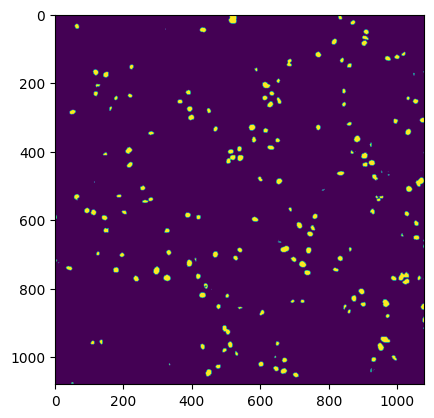

In [131]:
plt.imshow(binary_masks[0])

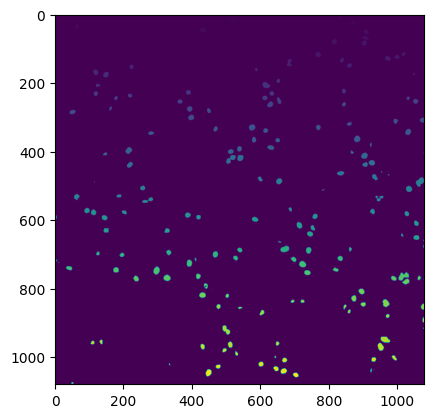

In [132]:
plt.imshow(instance_masks[0])

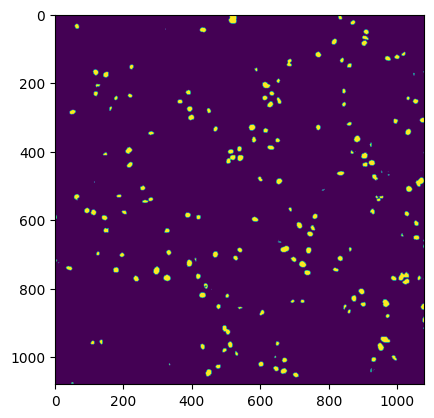

In [30]:
#Input: binary mask
#Output: instance mask
#bm = binary mask
#bm erode the outside of each masks to make sure that two masks connecting will not connect as much
#for each connecting clusters give them a unique number
#now add the pixels that have been eroded back
#now label these eroded pixels by whichever cluster they are connected to
#	if they are connected to two clusters then label them to the cluster's 	center they are closest to

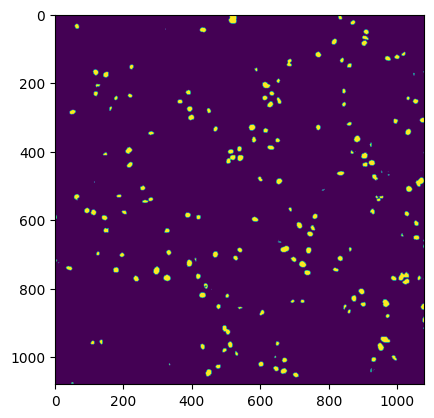

1


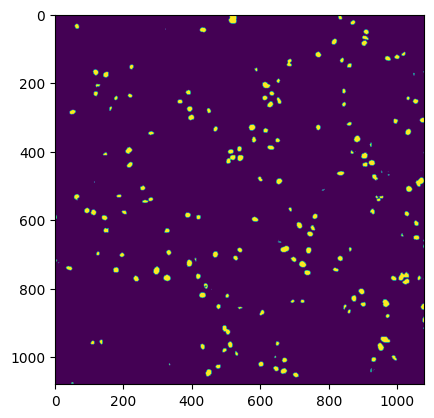

3


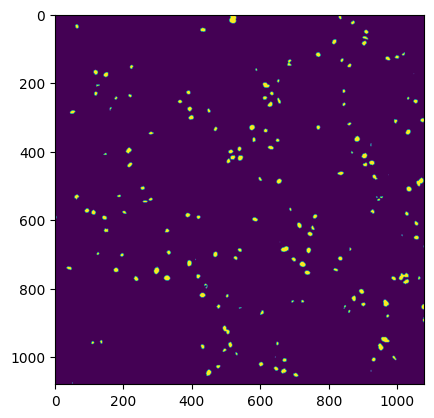

5


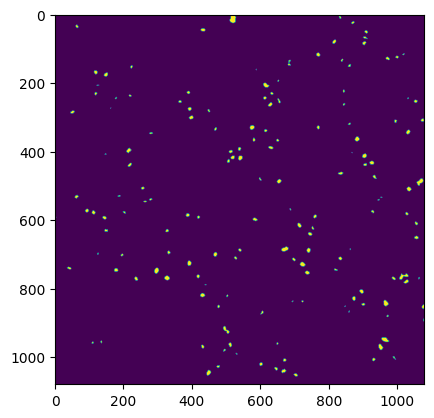

7


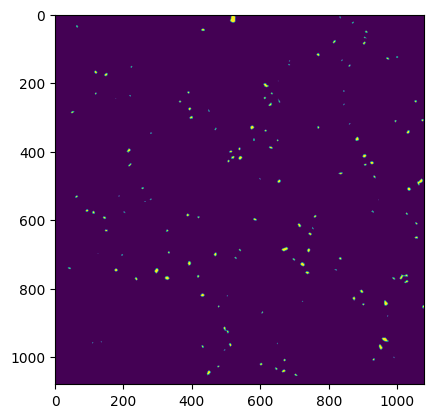

9


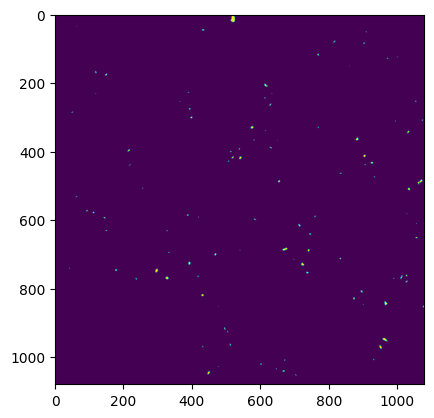

11


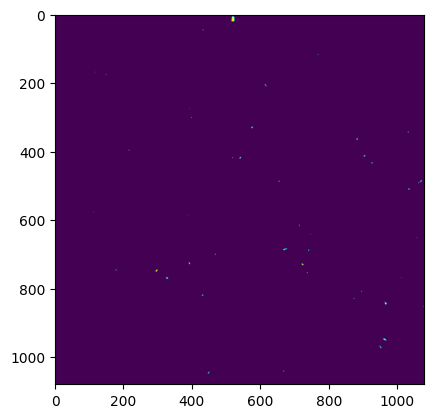

In [40]:
import cv2 as cv

k = [1,3,5,7,9,11]
plt.imshow(binary_masks[0])
plt.show()
for i in k:
    print(i)
    binary_mask = binary_masks[0]
    binary_mask = binary_mask.astype('uint8')
    kernel = np.ones((i,i),np.uint8)
    img_erosion = cv.erode(binary_mask, kernel, iterations=1)
    plt.imshow(img_erosion)
    plt.show()

In [51]:
#loop over the binary_mask
#find the first pixel that is 1
#add its coordinates to a list
#get the 8 connected pixels
#check if they are 1
#if they are 1 add it to the same list
#go to the next pixel in binary mask
#check if it is already in a list
#if it is then skip it
#if it is not then add it to a new list
#repeat until all pixels have been checked
#now we have a list of lists
#each list is a cluster of connected pixels
#now we need to label each cluster by a unique number each

clusters = []
for i in range(binary_mask.shape[0]):
    for j in range(binary_mask.shape[1]):
        current_pixel_coordinate = (i,j)
        if current_pixel_coordinate not in clusters:
            print(len(clusters))
            if binary_mask[i][j] == 1:
                #cluster = []
                clusters.append([current_pixel_coordinate])
                #get the 8 connected pixels
                for k in range(-1,2):
                    for l in range(-1,2):
                        x = i+k
                        y = j+l
                        if x < 0 or y < 0 or x > 1079 or y > 1079: continue
                        if binary_mask[i+k][j+l] == 1:
                            clusters[-1].append((i+k,j+l))
                #for coor in cluster:
                #    if coor in clusters:
                        #find the coordinate of the list in clusters that it is in

                        #add the coordinates of the current cluster to that list
                        

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


In [52]:
clusters_ini = clusters
print(len(clusters_ini))

26464


In [135]:
import numpy as np

def binary_mask_to_instance_mask(binary_mask,erosion_kernel_size=3):
    binary_mask = binary_mask.astype('uint8')
    kernel = np.ones((erosion_kernel_size,erosion_kernel_size),np.uint8)
    img_erosion = cv.erode(binary_mask, kernel, iterations=1)

    
    rows, cols = img_erosion.shape

    # Create a numpy array of zeros with the same shape as binary_mask
    visited = np.zeros_like(img_erosion, dtype=bool)

    # Create an empty list of clusters
    clusters = []

    # Loop through each pixel
    for i in range(rows):
        for j in range(cols):
            # Check if the pixel has not been visited and is part of a cluster
            if not visited[i, j] and img_erosion[i, j] == 1:
                # Create a new cluster and add the current pixel
                cluster = [(i, j)]
                # Mark the current pixel as visited
                visited[i, j] = True
                # Find all the neighboring pixels
                stack = [(i, j)]
                while stack:
                    pixel = stack.pop()
                    # Loop through all 8 neighboring pixels
                    for k in range(-1, 2):
                        for l in range(-1, 2):
                            # Check if the neighboring pixel is within the bounds of the image
                            x = pixel[0] + k
                            y = pixel[1] + l
                            if x < 0 or y < 0 or x >= rows or y >= cols:
                                continue
                            # Check if the neighboring pixel is part of the cluster and hasn't been visited
                            if img_erosion[x, y] == 1 and not visited[x, y]:
                                # Add the neighboring pixel to the cluster and mark it as visited
                                cluster.append((x, y))
                                visited[x, y] = True
                                stack.append((x, y))
                # Add the cluster to the list of clusters
                clusters.append(cluster)

    # create a 1080 by 1080 numpy array
    current_instance_mask = np.zeros((1080, 1080), dtype=np.uint8)
    
    # loop through the pixels and set the corresponding value in img
    for i, pixel_list in enumerate(clusters):
        for pixel in pixel_list:
            current_instance_mask[pixel] = i
    
    #now look at the unroded image and get the pixels that are 1
    #first get the center of each cluster
    centers = []
    for i in range(len(clusters)):
        cluster = clusters[i]
        x = 0
        y = 0
        for pixel in cluster:
            x += pixel[0]
            y += pixel[1]
        centers.append((x/len(cluster),y/len(cluster),i))

    #get the coordinates of the pixels that are 1 and where eroded in the original image
    current_instance_mask_binary = np.where(current_instance_mask != 0, 1, 0)
    diffferent_pixels = binary_mask-current_instance_mask_binary
    different_pixels_coordinates = np.where(diffferent_pixels != 0)
    different_pixels_coordinates = list(zip(different_pixels_coordinates[0],different_pixels_coordinates[1]))
    
    new_instance_mask = current_instance_mask.copy()
    for pixel_coordinates in different_pixels_coordinates:
        x = pixel_coordinates[0]
        y = pixel_coordinates[1]
        neighborhood = [(i, j) for i in range(x-1, x+2) for j in range(y-1, y+2)]
        
        # check the neighborhood of the pixel in the current instance mask binary are equal to 1
        # if they are we store their coordinates in a list
        coordinates_neighbours_equal_to_1 = []
        for i, j in neighborhood:
            if i >= 0 and i < current_instance_mask_binary.shape[0] and j >= 0 and j < current_instance_mask_binary.shape[1]:
                if current_instance_mask_binary[i, j] != 0:
                    coordinates_neighbours_equal_to_1.append((i,j))
                    
        if len(coordinates_neighbours_equal_to_1) == 0:
            continue
        # loop through the coordinates of the neighbors that are equal to 1 and get their value from the instance mask
        values_of_neighbours = []
        for i, j in coordinates_neighbours_equal_to_1:
            values_of_neighbours.append(current_instance_mask[i,j])
        
        # get the most common value in the list
        most_common_value = max(set(values_of_neighbours), key=values_of_neighbours.count)
        new_instance_mask[x,y] = most_common_value

    # img now contains the pixel values colored by the index of the list they belong to
    return current_instance_mask, new_instance_mask

In [145]:
binary_mask = binary_masks[0]
instance_mask, new_instance_mask = binary_mask_to_instance_mask(binary_mask,erosion_kernel_size=5)

In [141]:
print(len(np.where(instance_mask!=0)[0]))
print(len(np.where(new_instance_mask!=0)[0]))


10029
16579


In [146]:
print(len(np.where(instance_mask!=0)[0]))
print(len(np.where(new_instance_mask!=0)[0]))

10029
16579


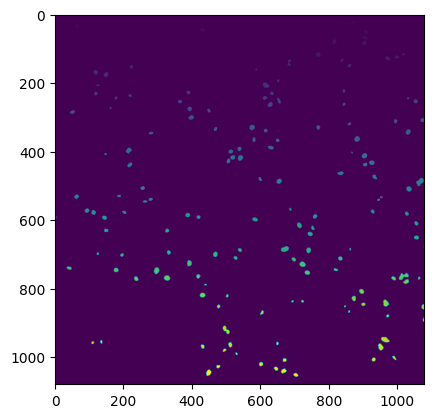

In [150]:
plt.imshow(new_instance_mask)

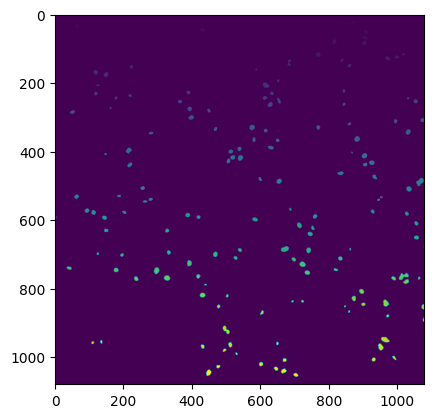

In [138]:
plt.imshow(new_instance_mask)

In [124]:
print(len(np.where(binary_mask-instance_mask==1)[0]))
print(len(np.where(instance_mask-binary_mask==1)[0]))

16435
43


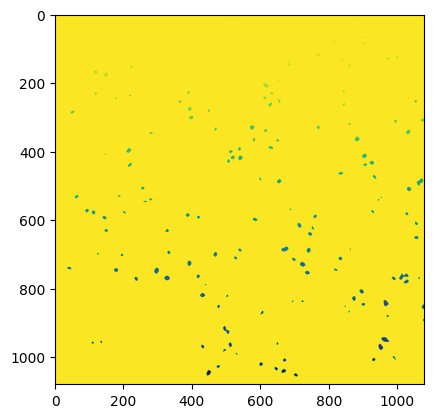

In [117]:
plt.imshow(binary_mask-instance_mask)

In [106]:
print(len(np.unique(instance_mask)))

159


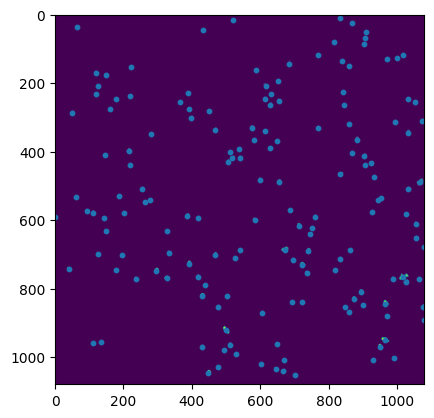

In [116]:
plt.imshow(instance_mask)
plt.scatter(centers[:,1],centers[:,0],s=10)

In [76]:
#get the average size of the clusters in instance_mask
sizes = []
for i in range(1,len(np.unique(instance_mask))):
    sizes.append(np.sum(instance_mask == i))
print(max(sizes))
print(np.mean(sizes))


434
133.74742268041237


In [75]:
#get the average size of the clusters in instance_mask
sizes = []
for i in range(1,len(np.unique(instance_masks[0]))):
    sizes.append(np.sum(instance_masks[0] == i))
print(max(sizes))
print(np.mean(sizes))

517
132.98492462311557


In [59]:
clusters_1 = clusters

In [60]:
import numpy as np

# create a 1080 by 1080 numpy array
img = np.zeros((1080, 1080), dtype=np.uint8)

# create a list of lists of pixels
pixels = [[(0, 0), (0, 1), (0, 2)],
          [(1, 0), (1, 1), (1, 2)],
          [(2, 0), (2, 1), (2, 2)]]

# loop through the pixels and set the corresponding value in img
for i, pixel_list in enumerate(clusters_1):
    for pixel in pixel_list:
        img[pixel] = i

# img now contains the pixel values colored by the index of the list they belong to


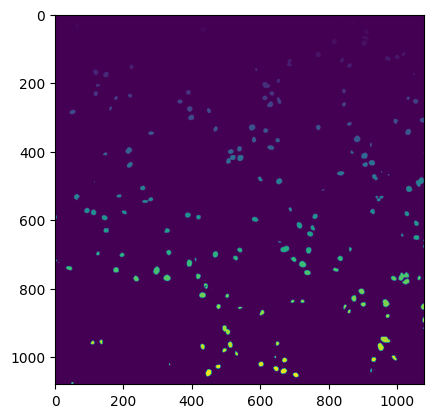

In [61]:
plt.imshow(img)

In [57]:
clusters_1 = clusters

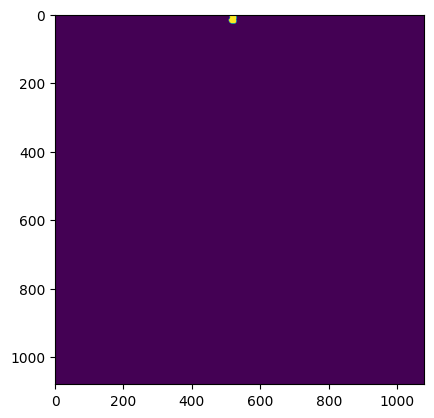

In [56]:
im = np.zeros((1080,1080))
for i in range(len(clusters[0])):
    im[clusters[0][i]] = 1
plt.imshow(im)
plt.show()

In [58]:
def find_clusters(binary_mask):
    # Create an array of zeros with the same shape as binary_mask
    visited = np.zeros_like(binary_mask, dtype=bool)
    # Create an empty list of clusters
    clusters = []

    # Create a meshgrid of row and column indices
    rows, cols = np.meshgrid(np.arange(binary_mask.shape[0]), np.arange(binary_mask.shape[1]), indexing='ij')
    # Find the indices of all the 1s in binary_mask
    nonzero_indices = np.transpose(np.nonzero(binary_mask))

    # Create a boolean mask for the nonzero indices
    nonzero_mask = np.zeros_like(binary_mask, dtype=bool)
    nonzero_mask[nonzero_indices[:,0], nonzero_indices[:,1]] = True

    # Find the indices of the unvisited 1s in binary_mask
    unvisited_indices = np.transpose(np.nonzero(np.logical_and(nonzero_mask, np.logical_not(visited))))

    # Loop through the unvisited 1s in binary_mask
    while unvisited_indices.size > 0:
        # Choose the first unvisited 1 as the seed pixel
        seed_index = unvisited_indices[0]
        # Create a new cluster and add the seed pixel
        cluster = [tuple(seed_index)]
        # Mark the seed pixel as visited
        visited[seed_index[0], seed_index[1]] = True
        # Find all the neighboring pixels in the cluster
        stack = [seed_index]
        while stack:
            # Pop the last pixel from the stack and add it to the cluster
            pixel = stack.pop()
            # Find the indices of all 8 neighboring pixels
            neighbor_indices = np.transpose([pixel]) + [[-1, 0], [1, 0], [0, -1], [0, 1], [-1, -1], [-1, 1], [1, -1], [1, 1]]
            # Create a boolean mask for the neighboring pixels
            neighbor_mask = np.logical_and(neighbor_indices[:,0] >= 0, neighbor_indices[:,0] < binary_mask.shape[0])
            neighbor_mask = np.logical_and(neighbor_mask, neighbor_indices[:,1] >= 0)
            neighbor_mask = np.logical_and(neighbor_mask, neighbor_indices[:,1] < binary_mask.shape[1])
            neighbor_indices = neighbor_indices[neighbor_mask]
            neighbor_mask = np.logical_and(nonzero_mask[neighbor_indices[:,0], neighbor_indices[:,1]], np.logical_not(visited[neighbor_indices[:,0], neighbor_indices[:,1]]))
            neighbor_indices = neighbor_indices[neighbor_mask]
            # Add the neighboring pixels to the cluster and mark them as visited
            cluster.extend([tuple(neighbor_index) for neighbor_index in neighbor_indices])
            visited[neighbor_indices[:,0], neighbor_indices[:,1]] = True
            stack.extend(neighbor_indices.tolist())
        # Add the cluster to the list of clusters
        clusters.append(cluster)
        # Find the indices of the unvisited 1s in binary_mask
        unvisited_indices = np.transpose(np.nonzero(np.logical_and(nonzero_mask, np.logical_not(visited))))

    return clusters

clusters_2 = find_clusters(binary_mask)

ValueError: operands could not be broadcast together with shapes (2,1) (8,2) 

In [ ]:
binary_col = [1 if binary_mask[i][j] == 1 else 0 for i in range(binary_mask.shape[0]) for j in range(binary_mask.shape[1])]